In [1]:
import os
import gc
import json
import math
import cv2
import PIL
import re
import numpy as np
import pandas as pd
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
#from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
from tqdm import tqdm
%matplotlib inline
#from keras.preprocessing import image
import glob
import tensorflow.keras.applications.densenet as dense
from kaggle_datasets import KaggleDatasets
import seaborn as sns

In [2]:
tf.__version__

'2.2.0'

In [3]:
train = pd.read_csv('/kaggle/input/siim-isic-melanoma-classification/train.csv')
test = pd.read_csv('/kaggle/input/siim-isic-melanoma-classification/test.csv')

print('Train: ', train.shape)
print("Test:", test.shape)

Train:  (33126, 8)
Test: (10982, 5)


In [4]:
train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 2.0+ MB


In [6]:
test.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,male,70.0,NaN
1,ISIC_0052349,IP_7782715,male,40.0,lower extremity
2,ISIC_0058510,IP_7960270,female,55.0,torso
3,ISIC_0073313,IP_6375035,female,50.0,torso
4,ISIC_0073502,IP_0589375,female,45.0,lower extremity


In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
dtypes: float64(1), object(4)
memory usage: 429.1+ KB


In [8]:
train['benign_malignant'].value_counts(normalize=True)

benign       0.98237
malignant    0.01763
Name: benign_malignant, dtype: float64

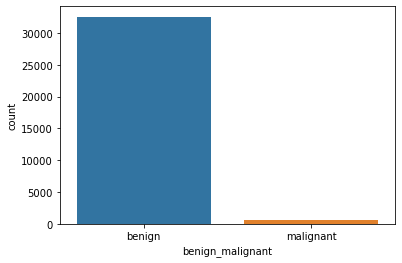

In [9]:
sns.countplot(train['benign_malignant'])

In [10]:
train['sex'].value_counts(normalize=True)

male      0.516621
female    0.483379
Name: sex, dtype: float64

In [11]:
train['target'].groupby(train['sex']).mean()

sex
female    0.013766
male      0.021311
Name: target, dtype: float64

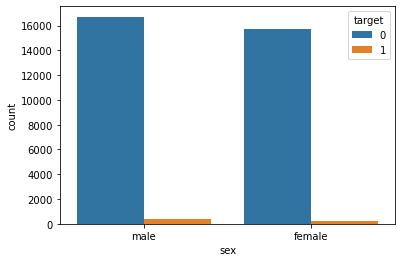

In [12]:
sns.countplot(train['sex'], hue=train['target'])

In [13]:
train['target'].groupby(train['age_approx']).mean()

age_approx
0.0     0.000000
10.0    0.000000
15.0    0.015152
20.0    0.009160
25.0    0.010363
30.0    0.010178
35.0    0.008772
40.0    0.006711
45.0    0.012091
50.0    0.012412
55.0    0.016736
60.0    0.020062
65.0    0.027701
70.0    0.029472
75.0    0.063201
80.0    0.085919
85.0    0.060403
90.0    0.200000
Name: target, dtype: float64

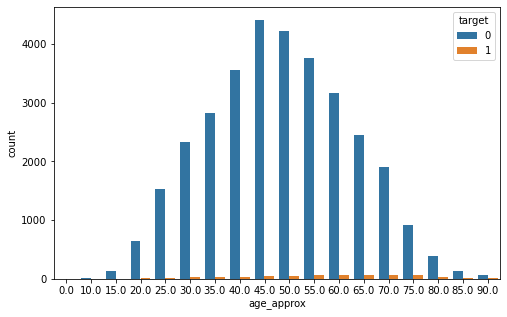

In [14]:
plt.figure(figsize=(8,5))
sns.countplot(train['age_approx'], hue=train['target'])

In [15]:
train['anatom_site_general_challenge'].value_counts(normalize=True)

torso              0.516734
lower extremity    0.258198
upper extremity    0.152857
head/neck          0.056904
palms/soles        0.011503
oral/genital       0.003804
Name: anatom_site_general_challenge, dtype: float64

In [16]:
train['target'].groupby(train['anatom_site_general_challenge']).mean()

anatom_site_general_challenge
head/neck          0.039892
lower extremity    0.014732
oral/genital       0.032258
palms/soles        0.013333
torso              0.015257
upper extremity    0.022276
Name: target, dtype: float64

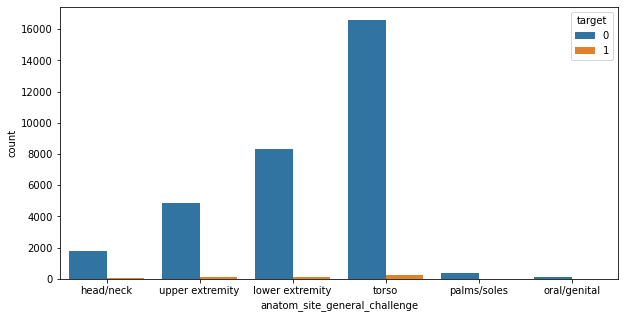

In [17]:
plt.figure(figsize=(10,5))
sns.countplot(train['anatom_site_general_challenge'], hue=train['target'])

In [18]:
train['diagnosis'].value_counts(normalize=True)

unknown                               0.818813
nevus                                 0.156765
melanoma                              0.017630
seborrheic keratosis                  0.004075
lentigo NOS                           0.001328
lichenoid keratosis                   0.001117
solar lentigo                         0.000211
cafe-au-lait macule                   0.000030
atypical melanocytic proliferation    0.000030
Name: diagnosis, dtype: float64

In [19]:
train['target'].groupby(train['diagnosis']).mean()

diagnosis
atypical melanocytic proliferation    0
cafe-au-lait macule                   0
lentigo NOS                           0
lichenoid keratosis                   0
melanoma                              1
nevus                                 0
seborrheic keratosis                  0
solar lentigo                         0
unknown                               0
Name: target, dtype: int64

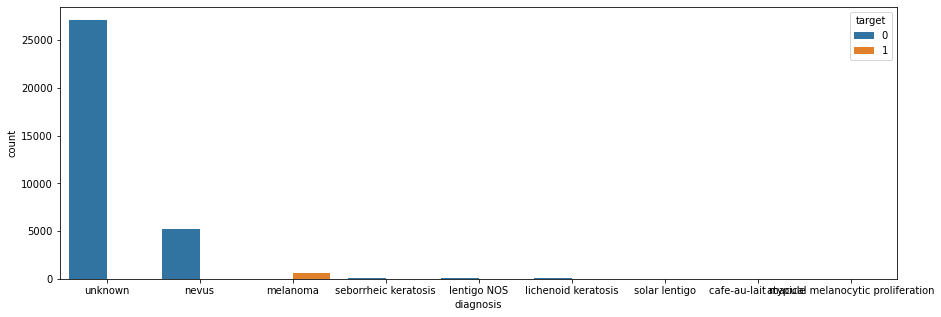

In [20]:
plt.figure(figsize=(15,5))
sns.countplot(train['diagnosis'], hue=train['target'])

In [21]:
train_df = train[['sex','age_approx','anatom_site_general_challenge','diagnosis','target']]
train_df.head()

,sex,age_approx,anatom_site_general_challenge,diagnosis,target
0,male,45.0,head/neck,unknown,0
1,female,45.0,upper extremity,unknown,0
2,female,50.0,lower extremity,nevus,0
3,female,45.0,head/neck,unknown,0
4,female,55.0,upper extremity,unknown,0


In [22]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_df = train_df.apply(lambda col: le.fit_transform(col.astype(str)), axis=0, result_type='expand')
train_df.head()

,sex,age_approx,anatom_site_general_challenge,diagnosis,target
0,1,8,0,8,0
1,0,8,6,8,0
2,0,9,1,5,0
3,0,8,0,8,0
4,0,10,6,8,0


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to c

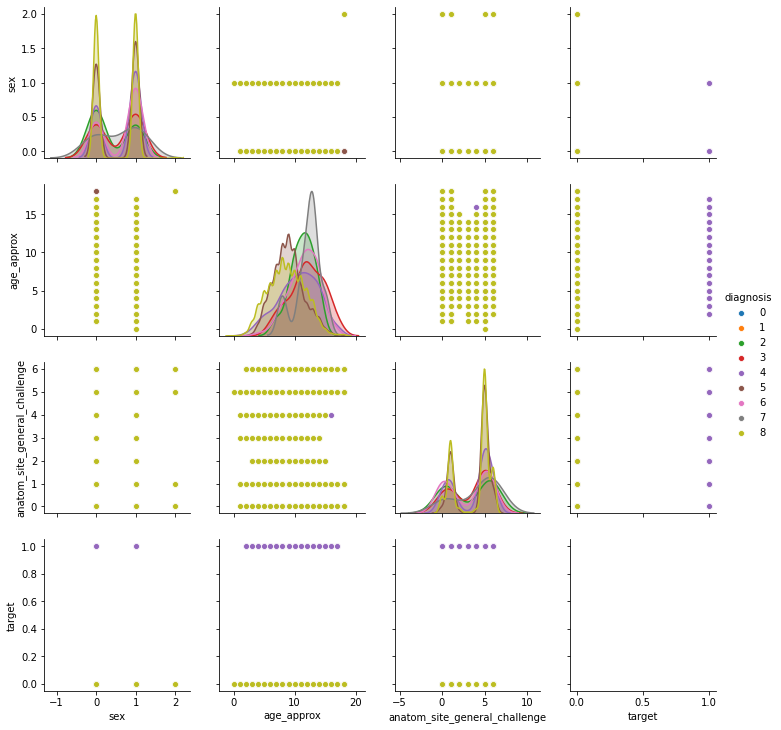

In [23]:
g = sns.pairplot(train_df, hue="diagnosis")

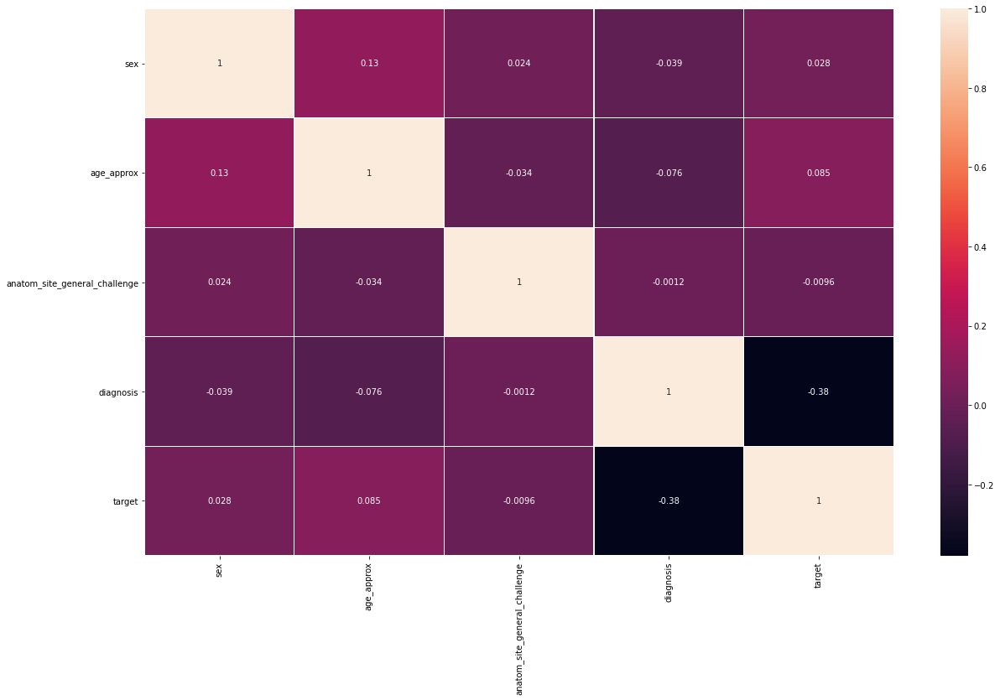

In [24]:
sns.heatmap(train_df.corr(),annot=True,linewidths=0.2) 
fig=plt.gcf()
fig.set_size_inches(20,12)
plt.show()

In [25]:
def display_training_curves(training, validation, title, subplot):
  if subplot%10==1: # set up the subplots on the first call
    plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
    plt.tight_layout()
  ax = plt.subplot(subplot)
  ax.set_facecolor('#F8F8F8')
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['train', 'valid.'])

cols, rows = 4, 3
def grid_display(list_of_images, no_of_columns=2, figsize=(15,15), title = False):
    fig = plt.figure(figsize=figsize)
    column = 0
    z = 0
    for i in range(len(list_of_images)):
        column += 1
        #  check for end of column and create a new figure
        if column == no_of_columns+1:
            fig = plt.figure(figsize=figsize)
            column = 1
        fig.add_subplot(1, no_of_columns, column)
        if title:
            if i >= no_of_columns:
                plt.title(titles[z])
                z +=1
            else:
                plt.title(titles[i])
        plt.imshow(list_of_images[i])
        plt.axis('off')

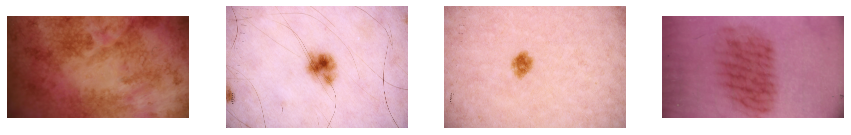

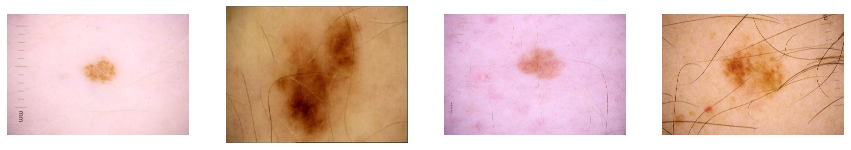

In [26]:
image_list = train[train['target'] == 0].sample(8)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
#show_images(image_all, cols=1)
grid_display(image_all, 4, (15,15))

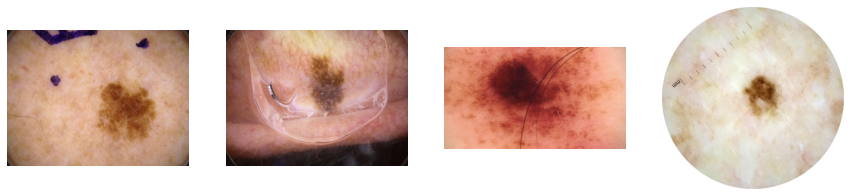

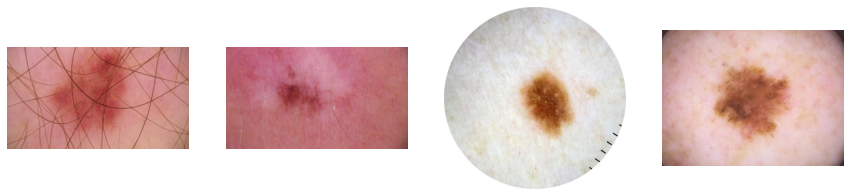

In [27]:
image_list = train[train['target'] == 1].sample(8)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

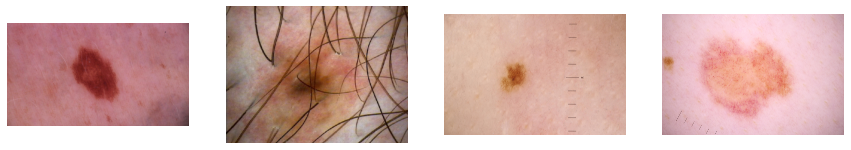

In [28]:
image_list = train[train['anatom_site_general_challenge'] == 'torso'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

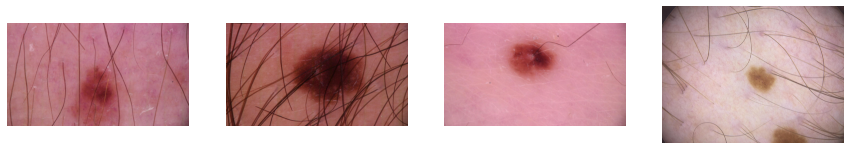

In [29]:
image_list = train[train['anatom_site_general_challenge'] == 'lower extremity'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

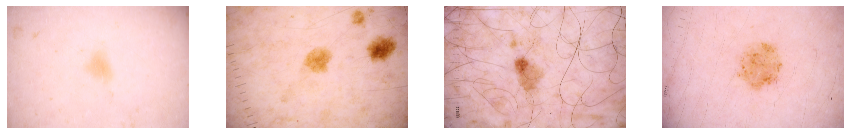

In [30]:
image_list = train[train['anatom_site_general_challenge'] == 'upper extremity'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

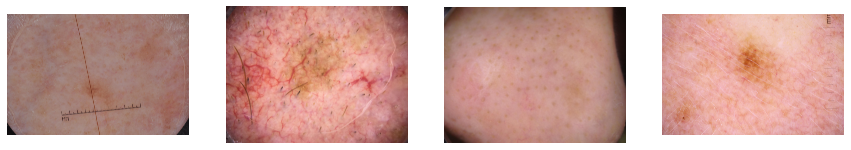

In [31]:
image_list = train[train['anatom_site_general_challenge'] == 'head/neck'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

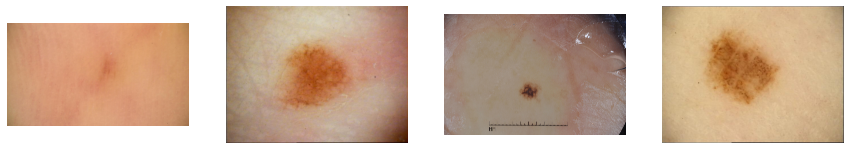

In [32]:
image_list = train[train['anatom_site_general_challenge'] == 'palms/soles'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

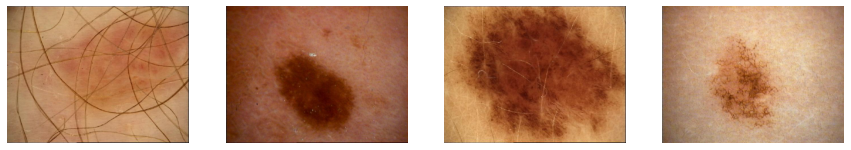

In [33]:
image_list = train[train['anatom_site_general_challenge'] == 'oral/genital'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

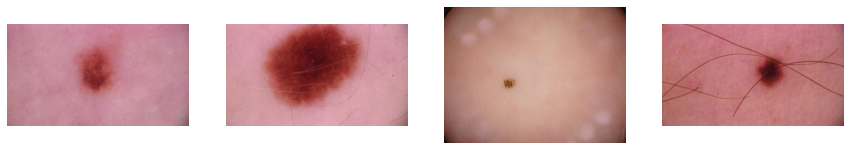

In [34]:
image_list = train[train['diagnosis'] == 'nevus'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

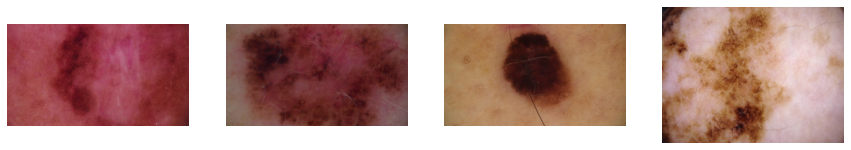

In [35]:
image_list = train[train['diagnosis'] == 'melanoma'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

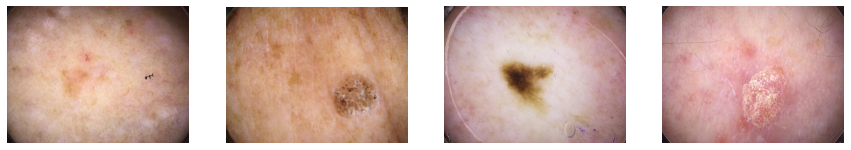

In [36]:
image_list = train[train['diagnosis'] == 'seborrheic keratosis'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

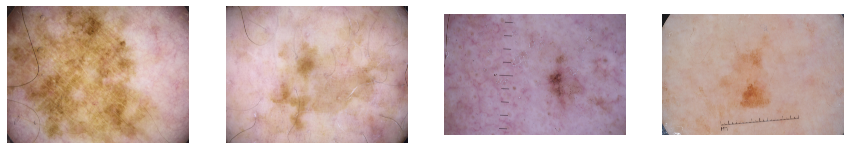

In [37]:
image_list = train[train['diagnosis'] == 'lentigo NOS'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

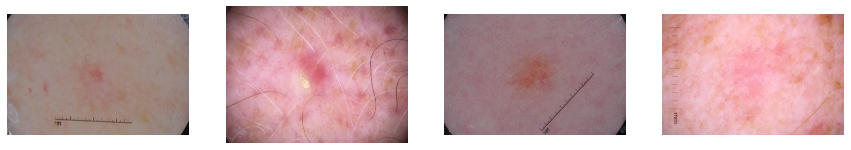

In [38]:
image_list = train[train['diagnosis'] == 'lichenoid keratosis'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

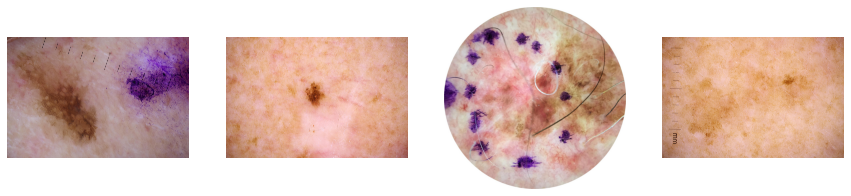

In [39]:
image_list = train[train['diagnosis'] == 'solar lentigo'].sample(4)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

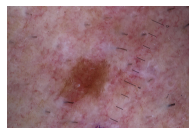

In [40]:
image_list = train[train['diagnosis'] == 'atypical melanocytic proliferation'].sample(1)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

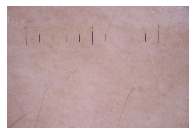

In [41]:
image_list = train[train['diagnosis'] == 'cafe-au-lait macule'].sample(1)['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

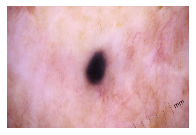

In [42]:
image_list = train[train['diagnosis'] == 'unknown'].sample()['image_name']
image_all=[]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
    img = np.array(Image.open(image_file))
    image_all.append(img)
grid_display(image_all, 4, (15,15))

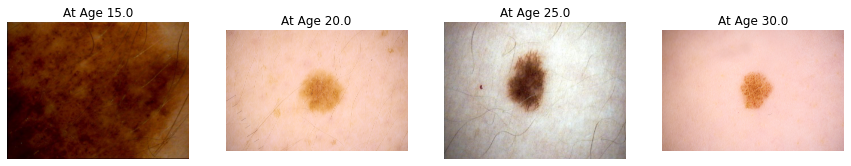

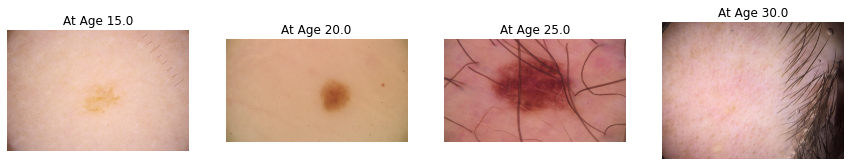

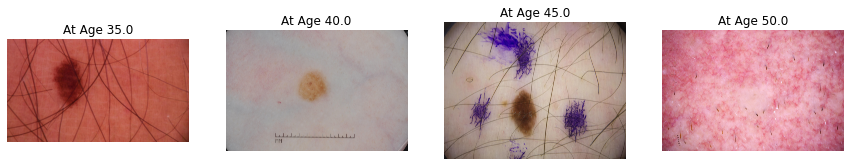

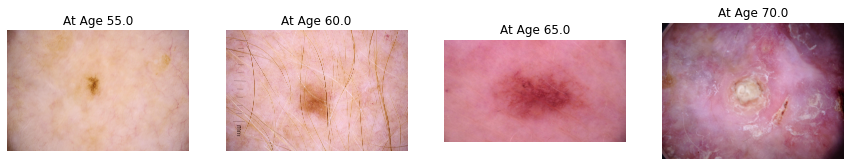

In [43]:
arr = [15.0,20.0,25.0,30.0,35.0,40.0,45.0,50.0,55.0,60.0,65.0,70.0,75.0,80.0,85.0,90.0]
image_all=[]
titles = ['At Age 15.0','At Age 20.0','At Age 25.0','At Age 30.0','At Age 35.0','At Age 40.0'
          ,'At Age 45.0','At Age 50.0','At Age 55.0','At Age 60.0','At Age 65.0','At Age 70.0'
          ,'At Age 75.0','At Age 80.0','At Age 85.0','At Age 90.0']
for i in arr:
    image_list = train[train['age_approx'] == i].sample()['image_name']
    for image_id in image_list:
        image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg' 
        img = np.array(Image.open(image_file))
        image_all.append(img)
grid_display(image_all, 4, (15,15), title = True)

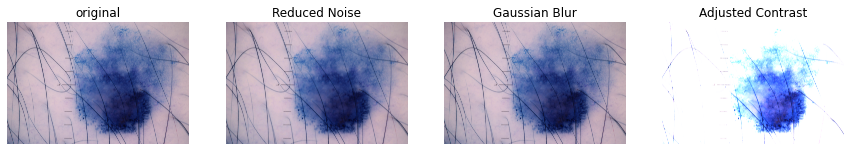

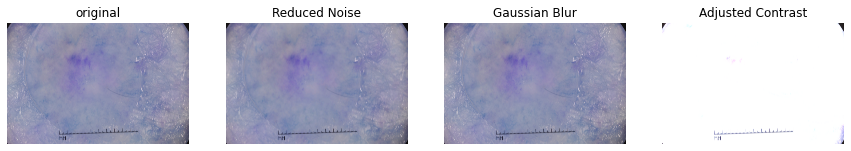

In [44]:
image_list = train[train['target'] == 1].sample(2)['image_name']
image_all=[]
titles = ['original', 'Reduced Noise', "Gaussian Blur", 'Adjusted Contrast']
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg'
    img = cv2.imread(image_file,1)
    image_all.append(img)
    #Reducing Noise
    result = cv2.fastNlMeansDenoisingColored(img,None,20,10,7,21)
    image_all.append(result)
    #Gaussian Blur
    blur_image = cv2.GaussianBlur(img, (7,7), 0)
    image_all.append(blur_image)
    #Adjusted contrast
    contrast_img = cv2.addWeighted(img, 2.5, np.zeros(img.shape, img.dtype), 0, 0)
    image_all.append(contrast_img)
grid_display(image_all, 4, (15,15), title = True)

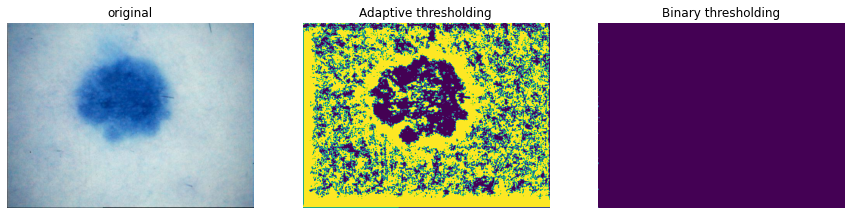

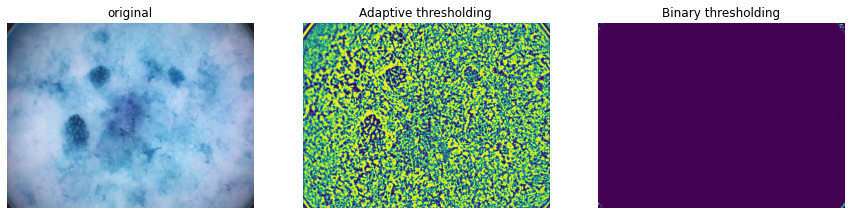

In [45]:
image_list = train[train['target'] == 1].sample(2)['image_name']
image_all=[]
titles = ['original', 'Adaptive thresholding', "Binary thresholding"]
for image_id in image_list:
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg'
    img = cv2.imread(image_file,1)
    image_all.append(img)
    #Adaptive Thresholding..
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    thresh1 = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
    image_all.append(thresh1)
    #Binary Thresholding...
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 
    res, thresh = cv2.threshold(hsv[:, :, 0], 0, 255, cv2.THRESH_BINARY_INV)
    image_all.append(thresh)
grid_display(image_all, 3, (15,15), title = True)

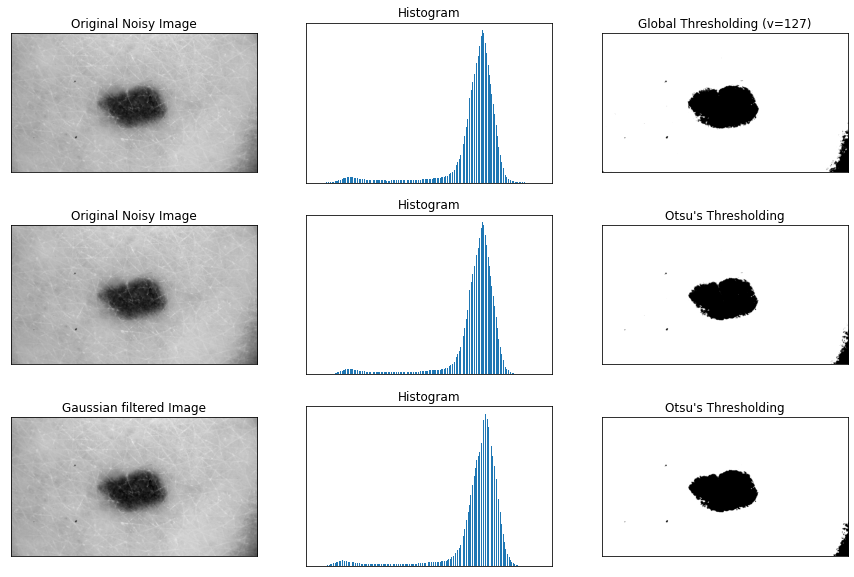

In [46]:
img = cv2.imread('/kaggle/input/siim-isic-melanoma-classification/jpeg/train/ISIC_0052212.jpg', 0)
# global thresholding
ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Otsu's thresholding
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
plt.figure(figsize=(15,10))
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

AREA:698301.0, perimeter:3396.0
AREA:5.5, perimeter:9.071067690849304
AREA:83.0, perimeter:43.79898953437805
AREA:54.5, perimeter:28.3847758769989
AREA:27.0, perimeter:22.14213526248932
AREA:8.5, perimeter:11.071067690849304
AREA:10.0, perimeter:11.656854152679443
AREA:15.0, perimeter:14.485281229019165
AREA:297.5, perimeter:97.1543276309967
AREA:51.5, perimeter:28.38477599620819
AREA:44.5, perimeter:27.55634880065918
AREA:13.0, perimeter:14.485281229019165
AREA:8.5, perimeter:11.071067690849304
AREA:4.0, perimeter:7.656854152679443
AREA:89.0, perimeter:40.627416253089905
AREA:115485.0, perimeter:1985.7484627962112
AREA:11.5, perimeter:14.242640614509583
AREA:0.0, perimeter:4.0
AREA:0.0, perimeter:0.0
AREA:0.0, perimeter:0.0
AREA:3.0, perimeter:7.656854152679443
AREA:60.5, perimeter:35.21320295333862
AREA:0.5, perimeter:3.414213538169861
AREA:87.0, perimeter:47.455843687057495
AREA:31.0, perimeter:23.313708424568176
AREA:0.0, perimeter:0.0
AREA:3.5, perimeter:8.242640614509583
AREA:3.0

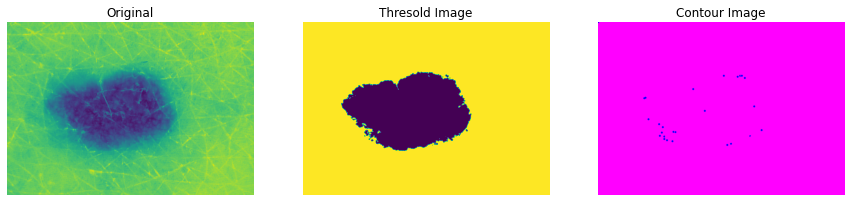

In [47]:
image = []
titles = ['Original', 'Thresold Image', 'Contour Image']
img = cv2.imread('/kaggle/input/siim-isic-melanoma-classification/jpeg/train/ISIC_0052212.jpg', 0)
img = img[200:900, 500:1500]
image.append(img)

#Apply thresholding
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
image.append(th3)
contours, hierarcy = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img2 = img.copy()
index = -1
thickness = 4
color = (255, 0, 255)

objects = np.zeros([img.shape[0], img.shape[1], 3], 'uint8')
for c in contours:
    cv2.drawContours(objects, [c], -1, color, -1)
    
    area = cv2.contourArea(c)
    perimeter = cv2.arcLength(c, True)
    
    M = cv2.moments(c)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
    # set values as what you need in the situation
        cx, cy = 0, 0
    cv2.circle(objects, (cx, cy), 4, (0, 0, 255), -1)
    
    print("AREA:{}, perimeter:{}".format(area, perimeter))

image.append(objects)
grid_display(image, 3, (15,15), title = True)

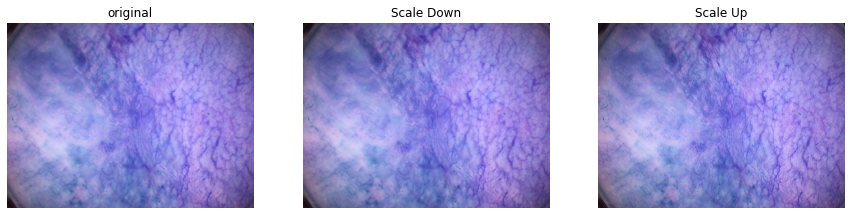

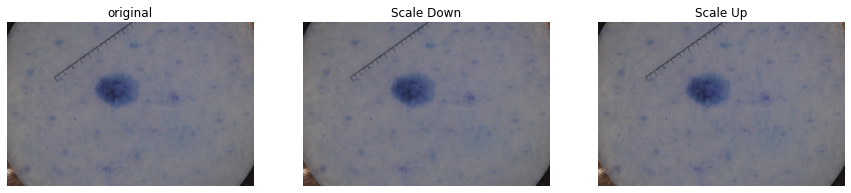

In [48]:
image_list = train[train['target'] == 1].sample(2)['image_name']
image_all=[]
titles = ['original', 'Scale Down', "Scale Up"]
for image_id in image_list:
    scaleX = 0.6
    scaleY = 0.6
    image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id+'.jpg'
    img = cv2.imread(image_file,1)
    image_all.append(img)
    # Scaling Down the image 0.6 times
    scaleDown = cv2.resize(img, None, fx= scaleX, fy= scaleY, interpolation= cv2.INTER_LINEAR)
    image_all.append(scaleDown)
    # Scaling up the image 1.8 times
    scaleUp = cv2.resize(img, None, fx= scaleX*3, fy= scaleY*3, interpolation= cv2.INTER_LINEAR)
    image_all.append(scaleUp)
grid_display(image_all, 3, (15,15), title = True)

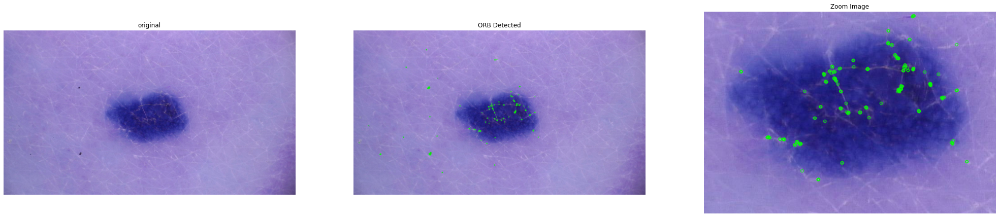

In [49]:
image_all=[]
titles = ['original', 'ORB Detected', "Zoom Image"]
img = cv2.imread('/kaggle/input/siim-isic-melanoma-classification/jpeg/train/ISIC_0052212.jpg', 1)
image_all.append(img)
# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints with ORB
kp = orb.detect(img,None)
# compute the descriptors with ORB
kp, des = orb.compute(img, kp)
# draw only keypoints location,not size and orientation
img2 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
image_all.append(img2)
img3 = img2[350:800,600:1250]
image_all.append(img3)
grid_display(image_all, 3, (35,35), title = True)

In [50]:
# Detect hardware
try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver() # TPU detection
except ValueError:
  tpu = None
#If TPU not found try with GPUs
  gpus = tf.config.experimental.list_logical_devices("GPU")
    
# Select appropriate distribution strategy for hardware
if tpu:
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.experimental.TPUStrategy(tpu)
  print('Running on TPU ', tpu.master())  
elif len(gpus) > 0:
  strategy = tf.distribute.MirroredStrategy(gpus) # this works for 1 to multiple GPUs
  print('Running on ', len(gpus), ' GPU(s) ')
else:
  strategy = tf.distribute.get_strategy()
  print('Running on CPU')

# How many accelerators do we have ?
print("Number of accelerators: ", strategy.num_replicas_in_sync)

Running on TPU  grpc://10.0.0.2:8470
Number of accelerators:  8


In [51]:
GCS_DS_PATH = KaggleDatasets().get_gcs_path('siim-isic-melanoma-classification')

In [52]:
TRAINING_FILENAMES = tf.io.gfile.glob(GCS_DS_PATH + '/tfrecords/train*')
TEST_FILENAMES = tf.io.gfile.glob(GCS_DS_PATH + '/tfrecords/test*')
BATCH_SIZE = 10 * strategy.num_replicas_in_sync
IMAGE_SIZE = [1024, 1024]
AUTO = tf.data.experimental.AUTOTUNE
imSize = 1024
EPOCHS = 10

VALIDATION_SPLIT = 0.18
split = int(len(TRAINING_FILENAMES) * VALIDATION_SPLIT)
training_filenames = TRAINING_FILENAMES[split:]
validation_filenames = TRAINING_FILENAMES[:split]
print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files"
      .format(len(TRAINING_FILENAMES), len(training_filenames), len(validation_filenames)))
TRAINING_FILENAMES = training_filenames

Pattern matches 16 data files. Splitting dataset into 14 training files and 2 validation files


In [53]:
def read_labeled_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "target": tf.io.FixedLenFeature([], tf.int64),  # shape [] means single element
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) # explicit size needed for TPU
    image = tf.image.resize(image, [imSize,imSize])
    label = tf.cast(example['target'], tf.int32)
    return image, label 

def read_unlabeled_tfrecord(example):
    u_features = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "image_name": tf.io.FixedLenFeature([], tf.string),  # shape [] means single element
    }
    example = tf.io.parse_single_example(example, u_features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) # explicit size needed for TPU
    image = tf.image.resize(image, [imSize,imSize])
    idnum = example['image_name']
    return image, idnum # returns a dataset of image(s)

def load_dataset(filenames, labeled=True, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed

    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(read_labeled_tfrecord if labeled else read_unlabeled_tfrecord, num_parallel_calls=AUTO)
    # returns a dataset of (image, label) pairs if labeled=True or (image, id) pairs if labeled=False
    return dataset

In [54]:
def data_augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    #image = tf.image.random_brightness(x, 0.2)
    #image = cutmix(image, label)
    return image, label   

def get_training_dataset(dataset, do_aug=True):
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)
    dataset = dataset.map(data_augment, num_parallel_calls=AUTO)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_validation_dataset(filenames, train=False):
    dataset = load_dataset(filenames, labeled=True)
    dataset = dataset.cache() # This dataset fits in RAM
    if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
        dataset = dataset.repeat()
        dataset = dataset.map(data_augment, num_parallel_calls=AUTO)
        dataset = dataset.shuffle(2000)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset
    
def get_test_dataset(dataset, ordered=False):
    dataset = load_dataset(dataset, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def count_data_items(filenames):
    # the number of data items is written in the name of the .tfrec files, i.e. flowers00-230.tfrec = 230 data items
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

validation_dataset = get_validation_dataset(validation_filenames, train=False)
training_dataset = get_training_dataset(TRAINING_FILENAMES)
test_dataset = get_test_dataset(TEST_FILENAMES)
NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)
NUM_VALID_IMAGES = count_data_items(validation_filenames)
validation_steps = NUM_VALID_IMAGES // BATCH_SIZE
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
print('Dataset: {} training images, {} unlabeled test images, {} validition images'
      .format(NUM_TRAINING_IMAGES, NUM_TEST_IMAGES, NUM_VALID_IMAGES))

Dataset: 28984 training images, 10982 unlabeled test images, 4142 validition images


In [55]:
def get_random_eraser(input_img,p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
   # def eraser(input_img):
    img_h, img_w, img_c = input_img.shape

    while True:
        s = np.random.uniform(s_l, s_h) * img_h * img_w
        r = np.random.uniform(r_1, r_2)
        w = int(np.sqrt(s / r))
        h = int(np.sqrt(s * r))
        left = np.random.randint(0, img_w)
        top = np.random.randint(0, img_h)

        if left + w <= img_w and top + h <= img_h:
            break

    if pixel_level:
        c = np.random.uniform(v_l, v_h, (h, w, img_c))
    else:
        c = np.random.uniform(v_l, v_h)

    input_img[top:top + h, left:left + w, :] = c

    return input_img

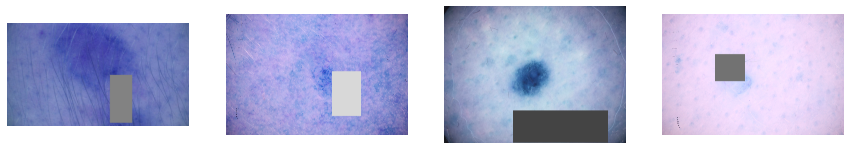

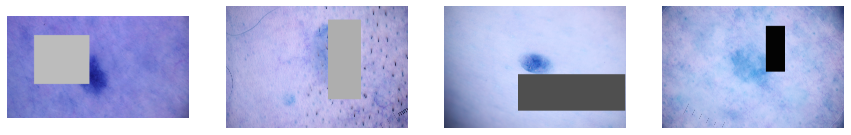

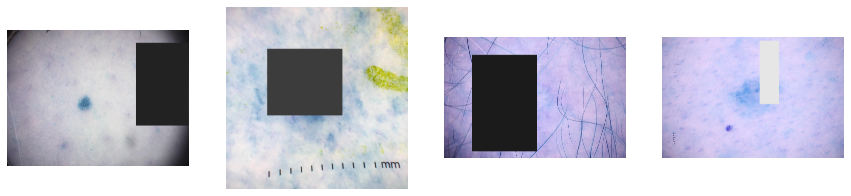

In [56]:
TRAIN = '/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'
IMAGE_SIZE = 1024
n_imgs = 12
img_filenames = os.listdir(TRAIN)[:n_imgs]
img_filenames[:3]
image=[]
for file_name in img_filenames:
    img = cv2.imread(TRAIN +file_name)
    img = get_random_eraser(img)
    image.append(img)
grid_display(image, 4, (15,15))

In [57]:
def onehot(image,label):
    CLASSES = 2
    return image,tf.one_hot(label,CLASSES)

def cutmix(image, label): #, PROBABILITY = 1.0
    # input image - is a batch of images of size [n,dim,dim,3] not a single image of [dim,dim,3]
    # output - a batch of images with cutmix applied
    DIM = 1024 #IMAGE_SIZE[0]
    CLASSES = 2
    
    imgs = []; labs = []
    for j in range(AUG_BATCH):
        # CHOOSE RANDOM IMAGE TO CUTMIX WITH
        k = tf.cast( tf.random.uniform([],0,AUG_BATCH),tf.int32)
        # CHOOSE RANDOM LOCATION
        x = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        y = tf.cast( tf.random.uniform([],0,DIM),tf.int32)
        b = tf.random.uniform([],0,1) # this is beta dist with alpha=1.0
        WIDTH = tf.cast( DIM * tf.math.sqrt(1-b),tf.int32)
        ya = tf.math.maximum(0,y-WIDTH//2)
        yb = tf.math.minimum(DIM,y+WIDTH//2)
        xa = tf.math.maximum(0,x-WIDTH//2)
        xb = tf.math.minimum(DIM,x+WIDTH//2)
        # MAKE CUTMIX IMAGE
        one = image[j,ya:yb,0:xa,:]
        two = image[k,ya:yb,xa:xb,:]
        three = image[j,ya:yb,xb:DIM,:]
        middle = tf.concat([one,two,three],axis=1)
        img = tf.concat([image[j,0:ya,:,:],middle,image[j,yb:DIM,:,:]],axis=0)
        imgs.append(img)
        # MAKE CUTMIX LABEL
        a = tf.cast(WIDTH*WIDTH/DIM/DIM,tf.float32)
        if len(label.shape)==1:
            lab1 = tf.one_hot(label[j],CLASSES)
            lab2 = tf.one_hot(label[k],CLASSES)
        else:
            lab1 = label[j,]
            lab2 = label[k,]
        labs.append((1-a)*lab1 + a*lab2)

    image2 = tf.reshape(tf.stack(imgs),(AUG_BATCH,DIM,DIM,3))
    label2 = tf.reshape(tf.stack(labs),(AUG_BATCH,CLASSES))
    return image2,label2

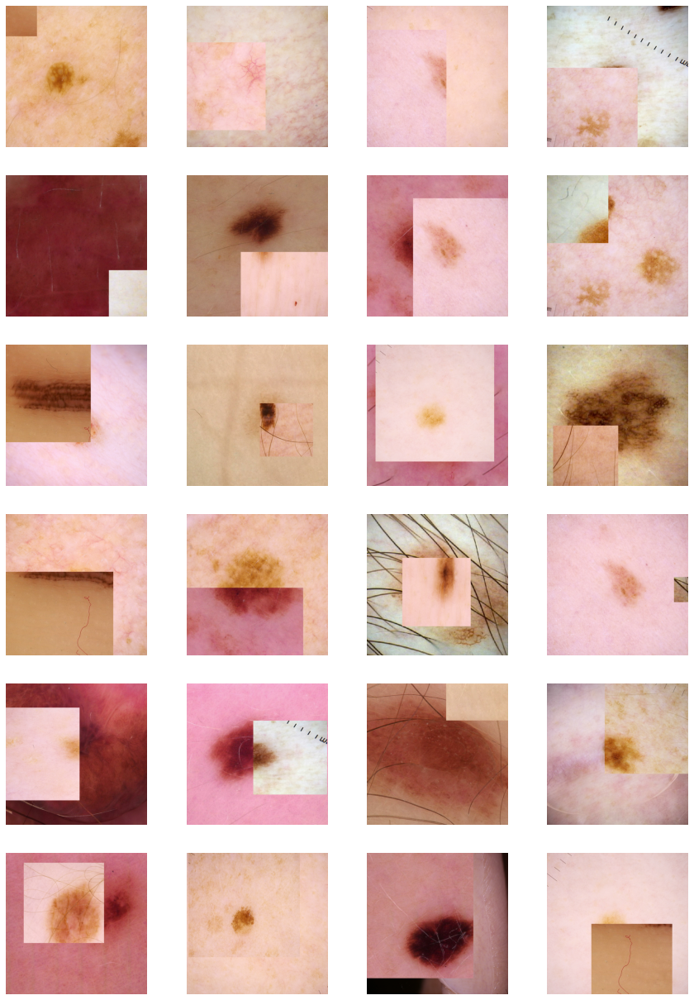

In [58]:
AUG_BATCH = 48
row = 6; col = 4;
row = min(row,AUG_BATCH//col)
all_elements = training_dataset.unbatch()
augmented_element = all_elements.repeat().batch(AUG_BATCH).map(cutmix)

for (img,label) in augmented_element:
    plt.figure(figsize=(15,int(15*row/col)))
    for j in range(row*col):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

In [59]:
def transform(image, inv_mat, image_shape):
    h, w, c = image_shape
    cx, cy = w//2, h//2
    new_xs = tf.repeat( tf.range(-cx, cx, 1), h)
    new_ys = tf.tile( tf.range(-cy, cy, 1), [w])
    new_zs = tf.ones([h*w], dtype=tf.int32)
    old_coords = tf.matmul(inv_mat, tf.cast(tf.stack([new_xs, new_ys, new_zs]), tf.float32))
    old_coords_x, old_coords_y = tf.round(old_coords[0, :] + w//2), tf.round(old_coords[1, :] + h//2)
    clip_mask_x = tf.logical_or(old_coords_x<0, old_coords_x>w-1)
    clip_mask_y = tf.logical_or(old_coords_y<0, old_coords_y>h-1)
    clip_mask = tf.logical_or(clip_mask_x, clip_mask_y)
    old_coords_x = tf.boolean_mask(old_coords_x, tf.logical_not(clip_mask))
    old_coords_y = tf.boolean_mask(old_coords_y, tf.logical_not(clip_mask))
    new_coords_x = tf.boolean_mask(new_xs+cx, tf.logical_not(clip_mask))
    new_coords_y = tf.boolean_mask(new_ys+cy, tf.logical_not(clip_mask))
    old_coords = tf.cast(tf.stack([old_coords_y, old_coords_x]), tf.int32)
    new_coords = tf.cast(tf.stack([new_coords_y, new_coords_x]), tf.int64)
    rotated_image_values = tf.gather_nd(image, tf.transpose(old_coords))
    rotated_image_channel = list()
    for i in range(c):
        vals = rotated_image_values[:,i]
        sparse_channel = tf.SparseTensor(tf.transpose(new_coords), vals, [h, w])
        rotated_image_channel.append(tf.sparse.to_dense(sparse_channel, default_value=0, validate_indices=False))
    return tf.transpose(tf.stack(rotated_image_channel), [1,2,0])

def random_rotate(image, angle, image_shape):
    def get_rotation_mat_inv(angle):
        # transform to radian
        angle = math.pi * angle / 180
        cos_val = tf.math.cos(angle)
        sin_val = tf.math.sin(angle)
        one = tf.constant([1], tf.float32)
        zero = tf.constant([0], tf.float32)
        rot_mat_inv = tf.concat([cos_val, sin_val, zero, -sin_val, cos_val, zero, zero, zero, one], axis=0)
        rot_mat_inv = tf.reshape(rot_mat_inv, [3,3])
        return rot_mat_inv
    angle = float(angle) * tf.random.normal([1],dtype='float32')
    rot_mat_inv = get_rotation_mat_inv(angle)
    return transform(image, rot_mat_inv, image_shape)


def GridMask(image_height, image_width, d1, d2, rotate_angle=1, ratio=0.5):
    h, w = image_height, image_width
    hh = int(np.ceil(np.sqrt(h*h+w*w)))
    hh = hh+1 if hh%2==1 else hh
    d = tf.random.uniform(shape=[], minval=d1, maxval=d2, dtype=tf.int32)
    l = tf.cast(tf.cast(d,tf.float32)*ratio+0.5, tf.int32)

    st_h = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)
    st_w = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)

    y_ranges = tf.range(-1 * d + st_h, -1 * d + st_h + l)
    x_ranges = tf.range(-1 * d + st_w, -1 * d + st_w + l)

    for i in range(0, hh//d+1):
        s1 = i * d + st_h
        s2 = i * d + st_w
        y_ranges = tf.concat([y_ranges, tf.range(s1,s1+l)], axis=0)
        x_ranges = tf.concat([x_ranges, tf.range(s2,s2+l)], axis=0)

    x_clip_mask = tf.logical_or(x_ranges < 0 , x_ranges > hh-1)
    y_clip_mask = tf.logical_or(y_ranges < 0 , y_ranges > hh-1)
    clip_mask = tf.logical_or(x_clip_mask, y_clip_mask)

    x_ranges = tf.boolean_mask(x_ranges, tf.logical_not(clip_mask))
    y_ranges = tf.boolean_mask(y_ranges, tf.logical_not(clip_mask))

    hh_ranges = tf.tile(tf.range(0,hh), [tf.cast(tf.reduce_sum(tf.ones_like(x_ranges)), tf.int32)])
    x_ranges = tf.repeat(x_ranges, hh)
    y_ranges = tf.repeat(y_ranges, hh)

    y_hh_indices = tf.transpose(tf.stack([y_ranges, hh_ranges]))
    x_hh_indices = tf.transpose(tf.stack([hh_ranges, x_ranges]))

    y_mask_sparse = tf.SparseTensor(tf.cast(y_hh_indices, tf.int64),  tf.zeros_like(y_ranges), [hh, hh])
    y_mask = tf.sparse.to_dense(y_mask_sparse, 1, False)

    x_mask_sparse = tf.SparseTensor(tf.cast(x_hh_indices, tf.int64), tf.zeros_like(x_ranges), [hh, hh])
    x_mask = tf.sparse.to_dense(x_mask_sparse, 1, False)

    mask = tf.expand_dims( tf.clip_by_value(x_mask + y_mask, 0, 1), axis=-1)

    mask = random_rotate(mask, rotate_angle, [hh, hh, 1])
    mask = tf.image.crop_to_bounding_box(mask, (hh-h)//2, (hh-w)//2, image_height, image_width)

    return mask

def apply_grid_mask(image, image_shape):
    AugParams = {
        'd1' : 100,
        'd2': 160,
        'rotate' : 45,
        'ratio' : 0.3
    }
    mask = GridMask(image_shape[0], image_shape[1], AugParams['d1'], AugParams['d2'], AugParams['rotate'], AugParams['ratio'])
    if image_shape[-1] == 3:
        mask = tf.concat([mask, mask, mask], axis=-1)
    return image * tf.cast(mask,tf.float32)

def gridmask(img_batch, label_batch):
    return apply_grid_mask(img_batch, (1024,1024, 3)), label_batch

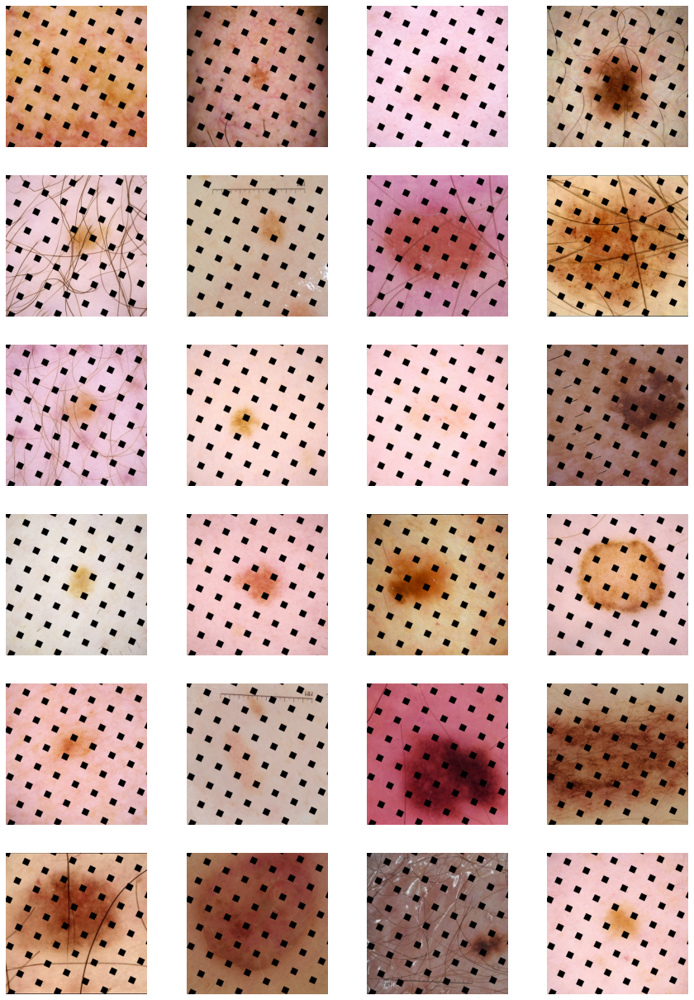

In [60]:
AUG_BATCH = 48
row = 6; col = 4;
row = min(row,AUG_BATCH//col)
all_elements = training_dataset.unbatch()
augmented_element = all_elements.repeat().batch(AUG_BATCH).map(gridmask)

for (img,label) in augmented_element:
    plt.figure(figsize=(15,int(15*row/col)))
    for j in range(row*col):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

In [61]:
# data dump
print("Training data shapes:")
for image, label in training_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Training data label examples:", label.numpy())

print("Validation data shapes:")
for image, label in validation_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Validation data label examples:", label.numpy())

print("Test data shapes:")
for image, idnum in test_dataset.take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Test data IDs:", idnum.numpy().astype('U'))

Training data shapes:
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
Training data label examples: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0]
Validation data shapes:
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
Validation data label examples: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0]
Test data shapes:
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
(80, 1024, 1024, 3) (80,)
Test data IDs: ['ISIC_9269637' 'ISIC_0664454' 'ISIC_2610536' 'ISIC_2404127'
 'ISIC_6332124' 'ISIC_1096286' 'ISIC_5659637' 'ISIC_7640239'
 'ISIC_0897958' 'ISIC_3063951' 'ISIC_6121082' 'ISIC_0857595'
 'ISIC_3127583' 'ISIC_3769075' 'ISIC_8073268' 'ISIC_8917520'
 'ISIC_2385082' 'ISIC_3884398' 'ISIC_6259642' 'ISIC_7

In [62]:
# with strategy.scope():
#     model = tf.keras.Sequential([
#         dense.DenseNet121(
#             input_shape=(imSize, imSize, 3),
#             weights='imagenet',
#             include_top=False
#         ),
#         layers.GlobalAveragePooling2D(),
#         layers.Dense(1, activation='sigmoid')
#     ])
        
#     model.compile(
#         optimizer='adam',
#         loss = 'binary_crossentropy',
#         metrics=['accuracy']
#     )
#     model.summary()

In [63]:
import tensorflow.keras.applications.xception as xcep
with strategy.scope():
    model = tf.keras.Sequential([
        xcep.Xception(
            input_shape=(imSize, imSize, 3),
            weights='imagenet',
            include_top=False
        ),
        layers.GlobalAveragePooling2D(),
        layers.Dense(1024, activation= 'relu'), 
        layers.Dropout(0.2),
        layers.Dense(512, activation= 'relu'), 
        layers.Dropout(0.2), 
        layers.Dense(256, activation='relu'), 
        layers.Dropout(0.2), 
        layers.Dense(128, activation='relu'), 
        layers.Dropout(0.1),
        layers.Dense(64, activation='relu'), 
        layers.Dropout(0.1),
        layers.Dense(1, activation='sigmoid')
    ])
        
    model.compile(
        optimizer='adam',
        loss = 'binary_crossentropy',
        metrics=['accuracy']
    )
    model.summary()

83689472/83683744 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 32, 32, 2048)      20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              2098176   
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________

In [64]:
# !pip install -q efficientnet

In [65]:
# import efficientnet.tfkeras as efn
# with strategy.scope():
#     model = tf.keras.Sequential([
#         efn.EfficientNetB5(
#             input_shape=(imSize, imSize, 3),
#             weights='imagenet',
#             include_top=False
#         ),
#         layers.GlobalAveragePooling2D(),
#         layers.Dense(512, activation= 'relu'), 
#         layers.Dropout(0.2), 
#         layers.Dense(256, activation='relu'), 
#         layers.Dropout(0.2), 
#         layers.Dense(128, activation='relu'), 
#         layers.Dropout(0.1),
#         layers.Dense(64, activation='relu'), 
#         layers.Dropout(0.1),
#         layers.Dense(1, activation='sigmoid')
#     ])
        
#     model.compile(
#         optimizer='adam',
#         loss = 'binary_crossentropy',
#         metrics=['accuracy']
#     )
#     model.summary()

In [66]:
def lrfn(epoch):
    LR_START = 0.00001
    LR_MAX = 0.00005 * strategy.num_replicas_in_sync
    LR_MIN = 0.00001
    LR_RAMPUP_EPOCHS = 5
    LR_SUSTAIN_EPOCHS = 0
    LR_EXP_DECAY = .8
    
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN
    return lr

lr_schedule = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=1)


In [67]:
EPOCHS = 10
history = model.fit(training_dataset, steps_per_epoch=STEPS_PER_EPOCH, epochs=EPOCHS,
                    validation_data=validation_dataset,callbacks=[lr_schedule])


Epoch 00001: LearningRateScheduler reducing learning rate to 1e-05.
Epoch 1/10
362/362 [==============================] - 439s 1s/step - loss: 0.1621 - accuracy: 0.9789 - val_loss: 0.0708 - val_accuracy: 0.9838 - lr: 1.0000e-05

Epoch 00002: LearningRateScheduler reducing learning rate to 8.8e-05.
Epoch 2/10
362/362 [==============================] - 407s 1s/step - loss: 0.0757 - accuracy: 0.9826 - val_loss: 0.0708 - val_accuracy: 0.9838 - lr: 8.8000e-05

Epoch 00003: LearningRateScheduler reducing learning rate to 0.000166.
Epoch 3/10
362/362 [==============================] - 405s 1s/step - loss: 0.0749 - accuracy: 0.9820 - val_loss: 0.1168 - val_accuracy: 0.9838 - lr: 1.6600e-04

Epoch 00004: LearningRateScheduler reducing learning rate to 0.000244.
Epoch 4/10
362/362 [==============================] - 406s 1s/step - loss: 0.0726 - accuracy: 0.9823 - val_loss: 0.0738 - val_accuracy: 0.9838 - lr: 2.4400e-04

Epoch 00005: LearningRateScheduler reducing learning rate to 0.000322.
Epoc

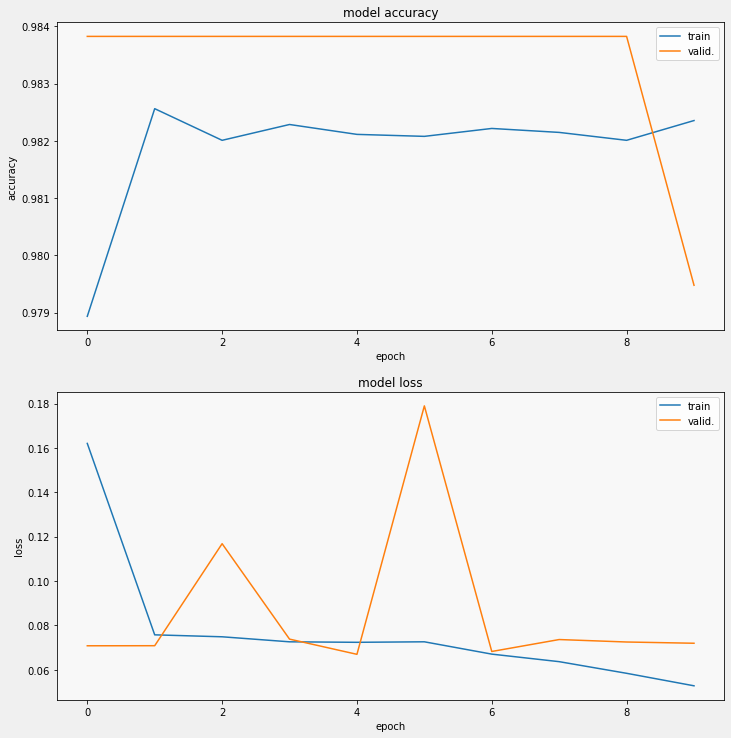

In [68]:
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)